<a href="https://colab.research.google.com/github/Terry-Migwi/Core-Week-7-IP-Notebook---Regression-Models/blob/master/Moringa_Data_Science_Core_W7_IP_2020_07_Terry_Migwi_Regression_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##1. Defining the question

#### Specifying the question

Given information on real estate properties, the main objective of this study is to:
1. Determine the factors that affect housing prices from the available data. 
2. Fit the following models to the data:

*   Multiple linear Regression
*   Quantile Regression
*   Ridge Regression
*   Lasso Regression
*   Elastic Net Regression
3. Determine the best model to use to predict the pricing of houses 

#### Defining the metrics for success

For this study to be considered successful, the following should be delivered:

1. Discuss the factors that contribute the most and the least to the pricing of a house from the data given.
2. Obtain an appropriate metic for evaluating all the five models and interpret the findings obtained on the metrics.
3. Draw conclusions and recommendations from the models


### Understanding the Context

Hass Consulting Company is a real estate company that buys already existing property, renovates and/or flips the property depending on the current house trends or on the market needs, and then sells the renovated property. The company has been in existence for 25 years mostly dealing in residential property and a bit of commercial property
 
The purchase or sale of property has always been a major decision the stakeholders and the management of the company have to make as this determines if the company will generate profits from purchasing, renovating and selling the property. This decision is usually influenced by a couple of factors that affect the pricing of the house. 

As the data scientist of the company, I therefore have a task to determine the factors that influence the pricing of a house as this will assist in the decision making process of purchasing and selling property.

### Recording the experimental design

The following are the steps that I intend to take to conduct this study
*   Loading datasets
*   Checking the available data
*   Data preparation
*   Performing Exploratory analysis i.e Univariate, Bivariate and     
  multivariate analysis 
*   Checking for multicollinearity
*   Fitting regression models to the data
*   Evaluating the models
*   Drawing conclusions and recommendations


2.## Reading the Data

In [ ]:
# importing necessary libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style()

In [ ]:
# loading the data
house_df = pd.read_csv("/content/Independent Project Week 7 - house_data.csv")

# previewing the top part of the data
house_df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
# previewing the bottom part of the data
house_df.tail()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,325000.0,2,0.75,1020,1076,2.0,0,0,3,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [ ]:
# checking the size of the dataset
house_df.shape

(21613, 20)

The dataset comprises 21,613 records and 20 columns

In [ ]:
# checking the columns present in our dataset
house_df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

The following is a description of the columns:
* Id - personal identification number of the house sold 
* price  - Price of the house 
* bedrooms - Number of Bedrooms
* bathrooms - Number of Bathrooms, where .5 accounts for a room with a toilet but without a shower  
* sqft_living - Square feet area of the apartments interior living space
* sqft_lot  - Square footage of the land space
* floors - Number of Floors the house has
* waterfront - Whether waterfront is there or not 
* view - An index from 0 - 4 of how good the view of the property was, with 0 not so good and 4 being quite good
* condition - An index from 1 to 5 on the condition of the apartment, 1 representing apartments in the most poor condition and 5 representing the apartment in the best condition
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design
* sqft_above -  The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation 
* zipcode - What zipcode area the house is in
* lat : Latitude of the house
* lon : Longitude of the house
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors



In [ ]:
# checking the datatypes assigned to our columns
house_df.dtypes

id                 int64
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

## Data Relevance

The data provided is a csv file with 21,613 records and 20 columns. Each of the columns have details of a particular house including the price. A description of the columns is clearly explained and all the columns are relevant for this analysis except for the id columns that is a unique identifier for the house. Some of the variables contain details that represent categories while others are integers and floats.  All of the columns that contain categorical data need to be changed to categorical datatypes. 

An aspect to look into however, is that the data provided contains details  for a few months. It would be important to find out if this data is influenced by the fluctuating real esate market and if so probably find a way to incorporate the changes in the market to the decision making process on the purchase and sale of houses.

### External data source validation

The data provided contains information of latitudes and longitudes for a given house. The longitude values range from**( -121.315 - -125.518)** while the latitude values range from **(47.15 - 47.76)**. Comparing these values to the actual longitude values that lie between **(-180 and 180)** and latitude values lie between** (-90 and 90)** from the world map verifies that the values are correct hence we can consider our data valid.

3.## Data Preparation

#### Checking for validity of our columns

In [ ]:
# checking for availabel columns
house_df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

The id columns is irrelevant to our study so we remove it

In [ ]:
# dropping the id column
house_df = house_df.drop(["id"], axis = 1)
# confirming the column was dropped
house_df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

#### Checking for completeness of our data

In [ ]:
# checking if the data contains any missing values
house_df.isnull().values.any()

False

The dataset does not contain any missing values hence we have a complete dataset.

####Checking for consistency of our data

In [ ]:
# checking for duplicates
house_df[house_df.duplicated()]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
3951,550000.0,4,1.75,2410,8447,2.0,0,3,4,8,2060,350,1936,1980,98074,47.6499,-122.088,2520,14789
4352,259950.0,2,2.00,1070,649,2.0,0,0,3,9,720,350,2008,0,98106,47.5213,-122.357,1070,928
14983,585000.0,3,2.50,2290,5089,2.0,0,0,3,9,2290,0,2001,0,98006,47.5443,-122.172,2290,7984
20054,555000.0,3,2.50,1940,3211,2.0,0,0,3,8,1940,0,2009,0,98027,47.5644,-122.093,1880,3078
20524,529500.0,3,2.25,1410,905,3.0,0,0,3,9,1410,0,2014,0,98116,47.5818,-122.402,1510,1352


The duplicated object returns three duplicated records, however, upon looking into the details, none of the records have all the details as duplicates hence we will maintain the records as they are not entirely duplicated and conclude that the data is consistent.

#### Ensuring uniformity of the data

In [ ]:
# checking datatypes 
house_df.dtypes

price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

Most columns do Not have appropriate datatypes. Hence the need to change the data type of columns to more appropriate datatypes for analysis of this study

In [ ]:
# changing datatypes

# changing floors to integer datatype
house_df["floors"]= house_df["floors"].astype('category')

# changing waterfront to categorical datatype as we have 
# 1 to represents houses that have a waterfront and 0 to represent houses without a waterfront
house_df["waterfront"]= house_df["waterfront"].astype('category')

# changing view to categorical datatype as we only have an index of 0 - 4
# with 0 representing houses that don't have such a good view and 4 representing houses with the best views
house_df["view"]= house_df["view"].astype('category')

# condition - An index from 1 to 5 on the condition of the apartment, 1 representing apartments in the most poor condition 
# and 5 representing the apartment in the best condition
house_df["condition"]= house_df["condition"].astype('category')

# grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 
# 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design
house_df["grade"]= house_df["grade"].astype('category')

house_df["yr_renovated"]= house_df["yr_renovated"].astype('category')

house_df["yr_built"]= house_df["yr_built"].astype('category')

# changing zipcode to category datatype
house_df["zipcode"]= house_df["zipcode"].astype('category')

# confirming the changes have been made
house_df.dtypes

price             float64
bedrooms            int64
bathrooms         float64
sqft_living         int64
sqft_lot            int64
floors           category
waterfront       category
view             category
condition        category
grade            category
sqft_above          int64
sqft_basement       int64
yr_built         category
yr_renovated     category
zipcode          category
lat               float64
long              float64
sqft_living15       int64
sqft_lot15          int64
dtype: object

All our columns are now of appropriate datatypes

#### Checking for outliers

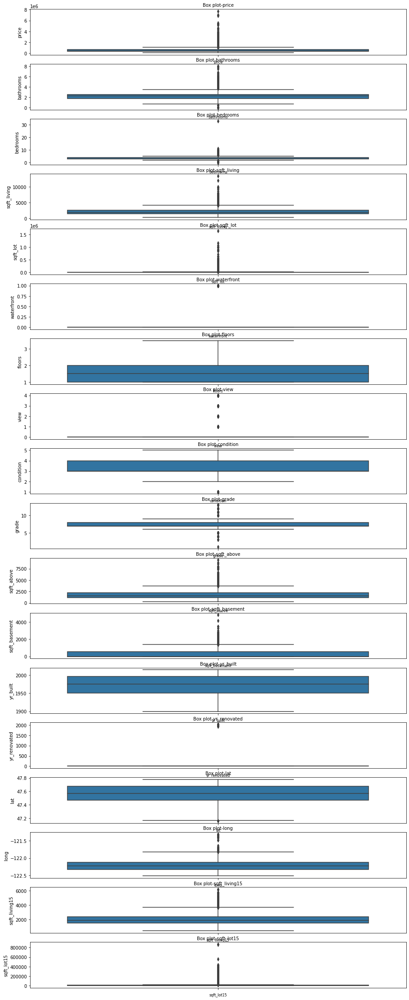

In [ ]:
columns = ['price', 'bathrooms', 'bedrooms', 'sqft_living', 'sqft_lot','waterfront','floors', 'view', 'condition', 'grade',
           'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15']


fig, ax = plt.subplots(len(columns), figsize = (15, 40))

for i, col_val in enumerate(columns):

  sns.boxplot(y= house_df[col_val], ax=ax[i])
  ax[i].set_title('Box plot-{}'.format(col_val), fontsize=10)
  ax[i].set_xlabel(col_val, fontsize=8)

plt.show()

The following observations from the boxplot are worth noting
1.   The price column has outlier values varying from 1.5 million all the way to 8 million. The values are evenly distributed from 1.5 million to 6 million then we have two observations between 6 million and 8 million. These are viable observations hence we will retain them. 

2.  The bedrooms column has fairly consistent observations ranging from houses with 0 - 10 bedrooms, however, we have one observation of a house with more than 30 bedrooms hence we will look into this as it seems unusual.

3.  The year renovated column has most observations at 0, however, we have a couple of observations from between 1900 and 2000, this could mean there were houses that were renovated hence we will retain this. 
4.   We have one observation with an extreemly low latitude hence we shall look into that as well

In [ ]:
# investigating the houses that have been sold for more than 6 million
high_end = house_df.loc[house_df['price'] > 6000000]
high_end

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
3914,7060000.0,5,4.50,10040,37325,2.0,1,2,3,11,7680,2360,1940,2001,98004,47.6500,-122.214,3930,25449
7252,7700000.0,6,8.00,12050,27600,2.5,0,3,4,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
9254,6890000.0,6,7.75,9890,31374,2.0,0,4,3,13,8860,1030,2001,0,98039,47.6305,-122.240,4540,42730


In [ ]:
# investigating the house with more than 30 bedrooms
bathrooms = house_df.loc[house_df['bedrooms'] > 30]
bathrooms

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


The observation with 33 bedrooms is clearly an anomaly hence we consider this an outlier and drop it.

In [ ]:
# removing outliers
house_df = house_df.drop([15870], axis='index')


In [ ]:
# confirming the record has been dropped
bathrooms = house_df.loc[house_df['bedrooms'] > 30]
bathrooms


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15


In [ ]:
# investigating the latitude column
print(house_df['lat'].max())
print(house_df['lat'].min())
print(house_df['lat'].mean())

47.7776
47.1559
47.56004660836569


The latitude values are fairly consistent hence we wil retain the minimum observation

4. ##Exploratory Data Aanalysis

In [ ]:
!pip install -U pandas-profiling

     |████████████████████████████████| 266kB 3.5MB/s 
     |████████████████████████████████| 3.1MB 9.9MB/s 
     |████████████████████████████████| 71kB 9.6MB/s 
     |████████████████████████████████| 604kB 30.6MB/s 
     |████████████████████████████████| 61kB 8.5MB/s 
     |████████████████████████████████| 71kB 8.8MB/s 
     |████████████████████████████████| 296kB 47.6MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27084 sha256=655155ca92eea121817760ec96cdffef476dfa70bb1f7d0c955994dfe8d523c3
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291990 sha256=95a0cfe47dc391243ba224b44dd148236409bc825dd5df648ceeb2307e748b30
  Stored in directory: /root/.cache/pip/wheels/07/1c/dc/6831446f09feb8cc199ec73a0f2f0703253f6ae013a22f4be9
Successfully built htmlmin imagehash
  Found existing installation: tqdm 4.41.1
    Uni

In [ ]:
import pandas_profiling as pp
import warnings
warnings.filterwarnings("ignore")


In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(house_df, title = "house data report")

# from pandas_profiling import ProfileReport
# ProfileReport(energy_df, title='Energy-use in Kenya')
# ProfileReport(house_df, title='Housing data')

###Findings from the report

**Some warnings from the report are:**

1.   The following columns have high cardinality:

*   yr built columns has a total of 116 distinct values
*   yr renovated has a total of 70 distinct values
*   zipcode column has a a total of 70 distinct values

2.   The index column has unique values as the column represents all the different records
3.   yr renovated and sqft basement columns have a most of their values as zeros  

**An overview of the entire dataset:**

The total number of observations is 21, 612. The total number of variables is 20, including the index column. We have 12 variables with numerical values and 8 variables with categorical values. We have no records with missing values and also no records with duplicate values.

**An overview of the columns**

1.   Price - The house that is the most expensive was sold at 7.7 million while the least expensive is 75,000. The mean value of the price column is 540,177.5

1.  Bedrooms - There are houses that have no bedrooms and the house with the maximum number of bedrooms has 11 bedrooms. The mean number of bedrooms is 3.4 hence most houses have bedrooms that are less than 4

1.   Bathrooms - Maximum number of bathrooms in a house is 8 while the minimum number of bathrooms is 0. The mean number of bathrooms is 2.11 

1.   Sqft_living - The maximum living area space is 13,540 sqft while the minimum living area space is 209 sqft. The mean of living area in sqft is 2079.92

1.   sqft_lot - The maximum area of the land the property is on is 1651359 sqft while the minimum is 520 sqft. The mean of the land is 15107.38895 sqft.

1.  floor -  houses are up to 3 floors with most of the houses having just 1 floor, followed by 2,1.5,2.5 and 3 floors 

1.   waterfront - most of the houses have no waterfront in their compound

1.   view - the column has numbers ranging from 1 - 4, representing how good the view of the house is. The view of most houses has been represented by 0 followed by 2,3,1,4

1.   condition - the column has numbers ranging from 1 to 5, representing the condition of the houses. The condition of most of the houses has been represented by 3

1.   grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7-10 has an average level of construction and design, and 11-13 have a high quality level of construction and design. Most houses have a grade of 7,8,9,10 in that order. This means  that most houses have an average level of construction and design.

1.   sqft_above - The house with the maximum area above ground level is has 9410 sqft while the minimum has 290 sqft

1.   sqft_basement - There are houses that do Not have a basement while the house with the maximim area sqft with a basement is 4820 sqft.

1.   yr_built - Most houses were built in 2106, followed by 2006

1.   yr_renovated - Most houses have not been renovated, a few houses were renovated in 2014 and 2013

1.   zipcode - we have a total of 70 disctinct zipcodes. The code 98103 is the most popular

1.   sqft_living15 - the maximum living area space between a house and 15 neighbouring houses is 6210 sqft while the minimum is 399 sqft

1.   sqft_lot15 - the maximum land space between a house and 15 neighbouring houses is 871200 sqft and the minimum is 651 sqft

1.   long - the west most longitude recorded is -122.51 while the east most is -122.213

1.   Lat - the highest latitude recorded is 47.78 while the lowest longitude is 47.1559




###Univariate Analysis

In [ ]:
house_df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
# getting statistical summary of the data
house_df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15
count,2.161200e+04,21612.000000,21612.000000,21612.000000,2.161200e+04,21612.000000,21612.000000,21612.000000,21612.000000,21612.000000,21612.000000
mean,5.401775e+05,3.369471,2.114774,2079.921016,1.510739e+04,1788.425319,291.495697,47.560047,-122.213891,1986.582871,12768.828984
std,3.673701e+05,0.907982,0.770177,918.456818,4.142142e+04,828.094487,442.580931,0.138564,0.140829,685.392610,27304.756179
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,290.000000,0.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.218375e+05,3.000000,1.750000,1426.500000,5.040000e+03,1190.000000,0.000000,47.470975,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.619000e+03,1560.000000,0.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068825e+04,2210.000000,560.000000,47.678000,-122.125000,2360.000000,10083.250000
max,7.700000e+06,11.000000,8.000000,13540.000000,1.651359e+06,9410.000000,4820.000000,47.777600,-121.315000,6210.000000,871200.000000


#### Mode

In [ ]:
# 
numerical_columns = ['price', 'bathrooms', 'bedrooms', 'sqft_living', 'sqft_lot','waterfront','floors', 'view', 'condition', 'grade',
           'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15'] 

# determining the mode values of all the columns with numerical values
for column in numerical_columns:
  print('\n')
  print(column +':' + str(house_df[column].mode()))



price:0    350000.0
1    450000.0
dtype: float64


bathrooms:0    2.5
dtype: float64


bedrooms:0    3
dtype: int64


sqft_living:0    1300
dtype: int64


sqft_lot:0    5000
dtype: int64


waterfront:0    0
Name: waterfront, dtype: category
Categories (2, int64): [0, 1]


floors:0    1.0
Name: floors, dtype: category
Categories (6, float64): [1.0, 1.5, 2.0, 2.5, 3.0, 3.5]


view:0    0
Name: view, dtype: category
Categories (5, int64): [0, 1, 2, 3, 4]


condition:0    3
Name: condition, dtype: category
Categories (5, int64): [1, 2, 3, 4, 5]


grade:0    7
Name: grade, dtype: category
Categories (12, int64): [1, 3, 4, 5, ..., 10, 11, 12, 13]


sqft_above:0    1300
dtype: int64


sqft_basement:0    0
dtype: int64


yr_built:0    2014
Name: yr_built, dtype: category
Categories (116, int64): [1900, 1901, 1902, 1903, ..., 2012, 2013, 2014, 2015]


yr_renovated:0    0
Name: yr_renovated, dtype: category
Categories (70, int64): [0, 1934, 1940, 1944, ..., 2012, 2013, 2014, 2015]


zipcode:0 

Price column is bimodal, most houses were sold at 350,000 and 450,0000.

Most houses sold had 2.5 bathrooms and 3 bedrooms and  had no waterfront.

####Measures of Dispersion 

In [ ]:
# determine the measures of dispersion of the price column
print(house_df["price"].var())
print(house_df["price"].std())
print(house_df["price"].skew())
print(house_df["price"].kurt())

134960792965.3561
367370.1035268876
4.021679945789497
34.5211670627573


Price has extreemly high variance, is positively skewed and has fat tails

#### Distribution plots

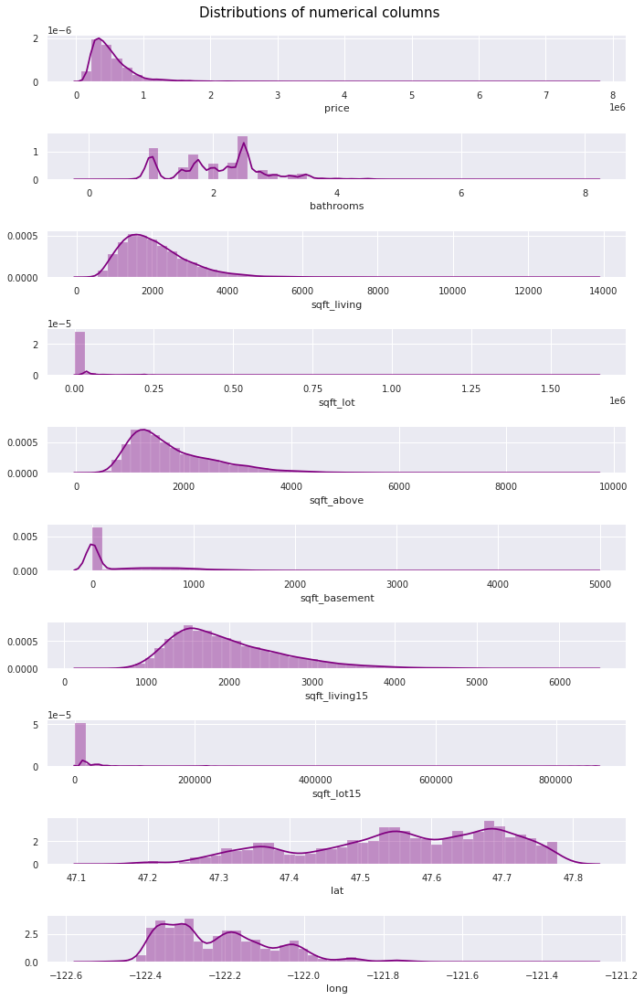

In [ ]:
# distribution plots for the numerical column

dist_columns = ['price', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above',
                'sqft_basement','sqft_living15', 'sqft_lot15', 'lat', 'long']

sns.set_style('darkgrid')
fig, axes = plt.subplots(len(dist_columns), figsize = (10, 15))
fig.suptitle('Distributions of numerical columns', y= 1.01, color = 'black', fontsize = 15)

for ax, data, name in zip(axes.flatten(), house_df, dist_columns):
  sns.distplot(house_df[name], ax = ax, kde = True, color = 'purple')
plt.tight_layout()

From the distribution plots above, following columns have the following distributions:

* price, sqft_living, sqft_living15, sqft above, latitude and longitude columns follow a normal distribution with the latitude and longitude columns being be trimodal

*  sqft_lot15, sqft_lot, sqft columns follow a negative binomial distribution

*  bathrooms column follows a binomial distribution
 


#### Bivariate Analysis

In [ ]:
house_df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
# creating a dataframe of numerical columns by dropping all the categorical columns from the house_df
numerical_df = house_df.drop(['floors', 'waterfront', 'view', 'condition', 'grade', 'yr_built','yr_renovated', 'zipcode'], axis = 1)
numerical_df.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1180,0,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2170,400,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,770,0,47.7379,-122.233,2720,8062


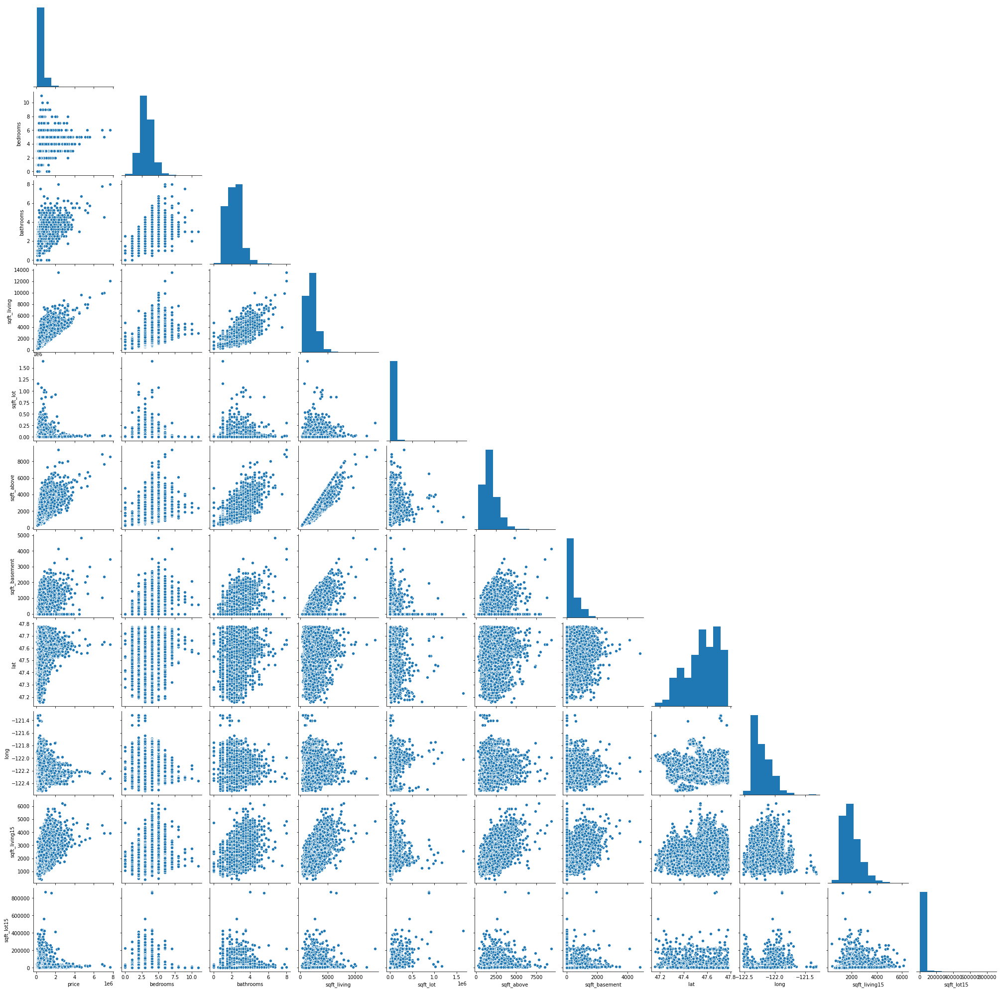

In [ ]:
# how do the does price relate to the numerical columns 

sns.pairplot(numerical_df, corner = True)

*   Bathrooms, sqft_living, sqft above, sqft basement and sqft_living15 have a clear linear relationship with the price column
*   sqft_lot, sqft_lot15 and bathrooms columns don't have a linear relationship with the price column



In [ ]:
house_df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
# categorical = house_df.drop(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above','sqft_basement', 
                             'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_built', 'yr_renovated', 'zipcode'], axis = 1)

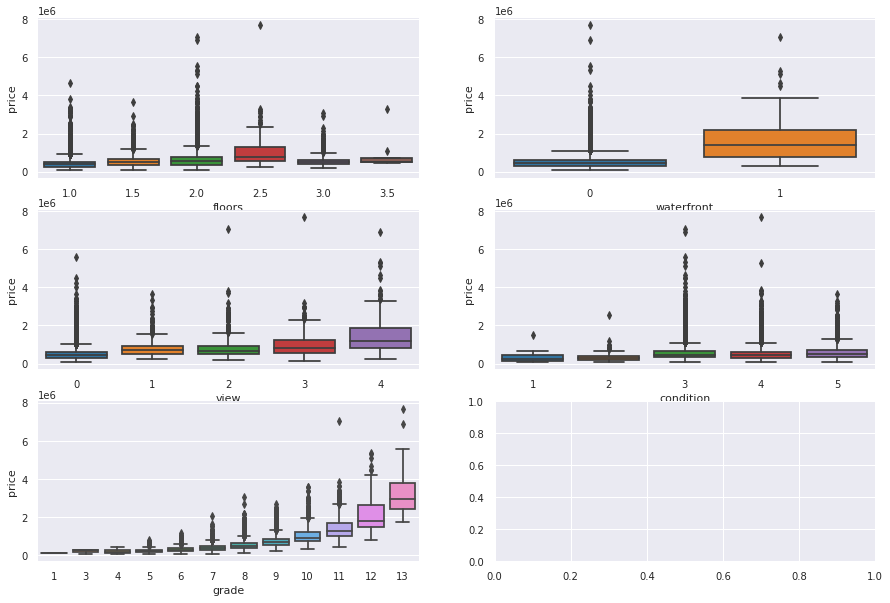

In [ ]:
# boxplots to determine how the categorial columns relate with price column

fig, ax = plt.subplots(3, 2, figsize=(15, 10))

for var, subplot in zip(categorical, ax.flatten()):
    sns.boxplot(x=var, y='price', data=house_df, ax=subplot)
# sns.boxplot(x = 'price', y = 'grade', data = house_df, palette = 'hls')

*   floors - The price of a house increases as the number of floors increases from houses that have 1 - 2.5 floors then reduces for houses with 3 and 3.5 floors.The that are most expensive houses have 2.5 floors


*   waterfront - Houses that have a waterfront are generally more expensive

*   view - The view of houses is represented by values 0 -4, the better the view the higher the value. The price of a house increases with a better view.



*   condition - houses with condition 5 seem to be most expensive, houses with conditions represented by 3 and 4 seem to be equally priced


*   grade - the price of a house increases with the grade allocated to the house. The higher the grade the higher the price



### Multivariate Analysis

In [ ]:
# assigning categorical variables integer datatypes to allow for modelling

# changing datatypes

# changing floors to integer datatype
house_df["floors"]= house_df["floors"].astype('int')

# changing waterfront to categorical datatype as we have 
# 1 to represents houses that have a waterfront and 0 to represent houses without a waterfront
house_df["waterfront"]= house_df["waterfront"].astype('int')

# changing view to categorical datatype as we only have an index of 0 - 4
# with 0 representing houses that don't have such a good view and 4 representing houses with the best views
house_df["view"]= house_df["view"].astype('int')

# condition - An index from 1 to 5 on the condition of the apartment, 1 representing apartments in the most poor condition 
# and 5 representing the apartment in the best condition
house_df["condition"]= house_df["condition"].astype('int')

# grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 
# 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design
house_df["grade"]= house_df["grade"].astype('int')

house_df["yr_renovated"]= house_df["yr_renovated"].astype('int')

house_df["yr_built"]= house_df["yr_built"].astype('int')

# changing zipcode to category datatype
house_df["zipcode"]= house_df["zipcode"].astype('int')

# confirming the changes have been made
house_df.dtypes


price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors             int64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [ ]:
# house_df.head()

In [ ]:
# dividing dataset into feature set and corresponding labels
X = house_df.drop('price',1)
y = house_df['price']

# splitting the data into train and test sets
# import train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# normalizing our data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# applying Principle Component Analyis
# importing pca
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

lda = LDA(n_components = 1)
X_train = lda.fit_transform(X_train, y_train)
X_test = lda.transform(X_test)

# printing factors that affect the price of a house in order of how much weight each of the factors carry 
factors = pd.DataFrame (index = X.columns.values, data = lda.coef_[0].T)
# pd.options.display.float_format = '{:.8f}'.float_format
factors.sort_values(0, ascending = False)

,0
yr_built,4.099200
long,2.800194
sqft_living,1.805524
sqft_basement,1.114892
floors,0.970722
sqft_lot15,0.769726
sqft_above,0.698249
zipcode,0.647634
yr_renovated,-0.177207
view,-0.614173


From the multi-variate analysis, the factors that contribute the most to the price of a house are:

1.   the year the house was built
1.   longitude location of the house
1.   living area space of  
1.   basement area space

whereas the factors that contribute the least to the price of a house are:


1.   grade, the level of construction and design.  
1.   lat location of the house
1.   the number of bathrooms the house has
1.   the number of bedrooms the house has




## Multiple Linear Regression
 



We will fit a linear regression model to our data in an attempt to predict the price(the dependent variable) of a house given multiple independent variables. We make the following considerations to fit the model:

1.   The dependent variable(price) is measured on a continous scale
1.   The independent variables are continous and categorical 
1.   We are assuming independence of observations
1.   We are assuming there is a linear relationship between the dependent and independent variables
1.   Our data does not have any significant outliers
1.   We are assuming our data is normally distributed
1.   We will check for multicollinearity in our independent variables
1.   We assume that the variances of our residuals are homogenous i.e homoskedasticity

In [ ]:
# loading all necessary libraries for regression
# from sklearn.preprocessing import StandardScaler
# from sklearn.model_selection import train_test_split
# from sklearn.model_selection import GridSearchCV
# from sklearn import linear_model
# from sklearn.metrics import mean_squared_error


### Multicollinearity

In [ ]:
house_df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
# creating a new dataframe of all independent variables to determine the multicollinearity of the variables
independent = house_df.drop(['price'], axis =1)

In [ ]:
# determine correlations between the variables 
correlations = independent.corr()
correlations

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.000000,0.529159,0.591467,0.032807,0.160655,-0.006611,0.081930,0.025478,0.366502,0.490600,0.309490,0.159167,0.019617,-0.157093,-0.010541,0.133882,0.402626,0.030402
bathrooms,0.529159,1.000000,0.754663,0.087735,0.519012,0.063742,0.187732,-0.124946,0.664979,0.685339,0.283789,0.506012,0.050735,-0.203858,0.024594,0.223028,0.568628,0.087170
sqft_living,0.591467,0.754663,1.000000,0.172822,0.353309,0.103816,0.284606,-0.058704,0.762701,0.876597,0.435065,0.318037,0.055358,-0.199421,0.052552,0.240209,0.756419,0.183280
sqft_lot,0.032807,0.087735,0.172822,1.000000,-0.008959,0.021603,0.074707,-0.008935,0.113616,0.183507,0.015293,0.053073,0.007641,-0.129571,-0.085675,0.229516,0.144602,0.718556
floors,0.160655,0.519012,0.353309,-0.008959,1.000000,0.019637,0.024647,-0.293127,0.472598,0.517897,-0.235817,0.578606,-0.007783,-0.096727,0.029603,0.158975,0.296536,-0.013263
waterfront,-0.006611,0.063742,0.103816,0.021603,0.019637,1.000000,0.401857,0.016665,0.082773,0.072072,0.080591,-0.026165,0.092884,0.030287,-0.014270,-0.041914,0.086461,0.030702
view,0.081930,0.187732,0.284606,0.074707,0.024647,0.401857,1.000000,0.046031,0.251315,0.167640,0.276959,-0.053452,0.103915,0.084834,0.006170,-0.078413,0.280432,0.072571
condition,0.025478,-0.124946,-0.058704,-0.008935,-0.293127,0.016665,0.046031,1.000000,-0.144632,-0.158136,0.174057,-0.361380,-0.060602,0.002973,-0.015048,-0.106423,-0.092731,-0.003373
grade,0.366502,0.664979,0.762701,0.113616,0.472598,0.082773,0.251315,-0.144632,1.000000,0.755919,0.168412,0.446952,0.014409,-0.184852,0.114111,0.198355,0.713198,0.119241
sqft_above,0.490600,0.685339,0.876597,0.183507,0.517897,0.072072,0.167640,-0.158136,0.755919,1.000000,-0.051918,0.423879,0.023276,-0.261177,-0.000778,0.343780,0.731860,0.194042


We have correlations of 1 accross the diagonal which is good. We now need to compute VIF scores to determine multi-collinearity

In [ ]:
# computing VIF scores for each variable
pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns = correlations.columns)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.713282,-0.509132,1.007660e+00,0.054227,0.120145,0.067210,0.118582,-0.044378,0.319570,-1.845726e+00,-9.822652e-01,0.113537,0.043780,0.080545,0.052549,0.023023,0.029314,0.093412
bathrooms,-0.509132,3.355884,-1.321089e+00,-0.026402,-0.699934,0.006665,-0.043149,-0.137270,-0.282079,-9.223207e-02,-4.136880e-01,-0.848076,-0.249413,0.032965,-0.043776,0.050988,0.112244,0.064461
sqft_living,1.010083,-1.312227,3.368268e+13,-0.244291,1.205569,-0.490373,1.992653,0.416932,-1.480901,-3.036881e+13,-1.623082e+13,0.657053,0.185169,-0.136549,0.238796,0.227950,-1.484312,0.146896
sqft_lot,0.054227,-0.026402,-2.462892e-01,2.102833,0.051409,0.027591,-0.058870,0.030796,-0.052995,2.091699e-02,7.487192e-02,0.091456,0.020558,-0.002246,0.053383,-0.132582,0.163036,-1.458562
floors,0.120145,-0.699934,1.205629e+00,0.051409,2.214196,-0.000559,-0.046044,0.094051,-0.223792,-1.546319e+00,2.075647e-02,-0.800867,-0.121952,-0.159386,-0.132816,0.183823,0.226636,0.093363
waterfront,0.067210,0.006665,-4.898059e-01,0.027591,-0.000559,1.203969,-0.492288,-0.012367,0.049755,3.254455e-01,2.321580e-01,-0.021544,-0.065419,0.022420,0.009881,0.027823,0.055067,-0.018031
view,0.118582,-0.043149,1.991246e+00,-0.058870,-0.046044,-0.492288,1.435858,-0.021471,-0.183521,-1.760874e+00,-1.218552e+00,0.159467,-0.039062,-0.140364,0.119131,0.070999,-0.324882,-0.007529
condition,-0.044378,-0.137270,4.184445e-01,0.030796,0.094051,-0.012367,-0.021471,1.249167,-0.053222,-3.197622e-01,-3.016584e-01,0.549138,0.205124,0.162200,0.063829,-0.006531,0.073310,-0.027410
grade,0.319570,-0.282079,-1.495958e+00,-0.052995,-0.223792,0.049755,-0.183521,-0.053222,3.418349,-2.866506e-01,2.363489e-01,-0.610480,-0.067537,0.081194,-0.330677,0.394075,-0.903406,0.072105
sqft_above,-1.849076,-0.094336,-3.036881e+13,0.019266,-1.545945,0.325952,-1.762342,-0.318575,-0.300027,2.738097e+13,1.463395e+13,-0.034635,-0.164979,0.033965,-0.042490,-0.544186,-0.175474,-0.312896


The columns with VIF scores above 5 are sqft_living, sqft_above and sqft_basement while all the other columns have VIF scores below 5. We will check which columns are highly correlated to the three mentioned above.

In [ ]:
# removing the columns with the higest VIF scores to observe changes
revised = independent.drop(columns = ['sqft_living', 'sqft_above', 'sqft_basement'], axis = 1)

In [ ]:
# computing the VIF scores
correlations = revised.corr()
pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns = correlations.columns)

,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
bedrooms,1.501426,-0.851861,0.017813,0.137886,0.049248,0.086439,-0.050178,0.004864,0.221676,0.040666,0.056475,0.066884,-0.006499,-0.268364,0.057964
bathrooms,-0.851861,2.726620,-0.072966,-0.504069,-0.011007,-0.150077,-0.172472,-0.716156,-0.697636,-0.259352,-0.011406,-0.054582,0.067881,-0.308609,0.014404
sqft_lot,0.017813,-0.072966,2.094537,0.026874,0.022625,-0.055331,0.034060,-0.119470,0.114087,0.020831,-0.005487,0.061456,-0.148324,0.101851,-1.465858
floors,0.137886,-0.504069,0.026874,1.839198,-0.024498,0.079379,0.152226,-0.365103,-0.755174,-0.110739,-0.145235,-0.058058,0.041840,0.115901,0.080043
waterfront,0.049248,-0.011007,0.022625,-0.024498,1.200713,-0.486654,-0.008929,0.011652,-0.008646,-0.064937,0.021206,0.016270,0.015480,0.020588,-0.022146
view,0.086439,-0.150077,-0.055331,0.079379,-0.486654,1.390653,-0.041307,-0.176177,0.157885,-0.043133,-0.148004,0.096347,0.113986,-0.325470,-0.007555
condition,-0.050178,-0.172472,0.034060,0.152226,-0.008929,-0.041307,1.240098,-0.035942,0.543642,0.203347,0.159667,0.052490,0.014973,0.086113,-0.025865
grade,0.004864,-0.716156,-0.119470,-0.365103,0.011652,-0.176177,-0.035942,2.875599,-0.425267,-0.067246,0.050885,-0.275287,0.285377,-1.406496,0.012136
yr_built,0.221676,-0.697636,0.114087,-0.755174,-0.008646,0.157885,0.543642,-0.425267,2.543286,0.559150,0.284875,0.310204,-0.496598,0.232701,-0.028929
yr_renovated,0.040666,-0.259352,0.020831,-0.110739,-0.064937,-0.043133,0.203347,-0.067246,0.559150,1.153797,0.038286,0.046380,-0.054344,0.097200,-0.024301


bathrooms and yr built columns have recorded a significant decrease in VIF scores hence they are the columns that are highly related to the above columns with the highest VIF scores. 


In [ ]:
# creating dependent and independent variables

X = house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']].values
y = house_df["price"].values.reshape(-1,1)

# splitting our data into train and test sets
# importing train, test, split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# importing the Linear Regression
from sklearn.linear_model import LinearRegression

# fitting a linear regression
linear = LinearRegression()
linear.fit(X_train, y_train)

# importing mean squared error metric
from sklearn.metrics import mean_squared_error

first_linear_model = (mean_squared_error(y_true = y_test, y_pred = linear.predict(X_test))) 
print(first_linear_model)   


38933070462.233315


The MSE score of our test data is 38933070426.233. This value is extreemly high, an indication that our model did Not do well. This could be attributed to the presence of multicollinearity in the data and heteroscedasticity in the data.


We exclude the variables with very high VIF scores to observe how this will affect the model.

In [ ]:
# creating dependent and independent variables
# excluding variables that have shown multicollinearity

T = house_df[['bedrooms', 'sqft_lot', 'sqft_living', 'floors', 'waterfront', 'view', 'condition','grade', 
             'sqft_above', 'sqft_basement','yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']].values
s = house_df["price"].values.reshape(-1,1)

# splitting our data into train and test sets
T_train, T_test, s_train, s_test = train_test_split(T, s, test_size = 0.2, random_state = 0)

# importing the Linear Regression
from sklearn.linear_model import LinearRegression

# fitting a linear regression
linear = LinearRegression()
linear.fit(T_train, s_train)

second_linear_model = (mean_squared_error(y_true = s_test, y_pred = linear.predict(T_test))) 
print(second_linear_model)   

41180015072.41897


Excluding the columns with high VIF scores increases the MSE score of the model. This is probably because excluding the columns reduces the number of observations included.

In [ ]:
# obtaining coefficient values from the linear regression model
C= house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]

# 
coef_dict_baseline = {}
for coef, feat in zip(linear.coef_,C.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

{'bedrooms': array([-3.93857899e+04,  4.25017689e+04,  1.12927588e+02,  1.50658402e-01,
         5.28716700e+03,  6.01245251e+05,  5.49920298e+04,  2.65075827e+04,
         9.46910607e+04,  7.36096909e+01,  3.93178968e+01, -2.63209855e+03,
         1.93935248e+01, -5.76986709e+02,  6.10618558e+05, -2.11848609e+05,
         1.79301063e+01, -4.21805602e-01])}

#### Residual plots and heteroscedasticity test

In [ ]:
# making predictions
y_pred = linear.predict(X_test)

# creating the residuals
residuals = np.subtract(y_pred, y_test)

# describing our residuals
print(pd.DataFrame(residuals).describe())
print(residuals.mean())

                  0
count  4.323000e+03
mean   6.766938e+01
std    1.973375e+05
min   -3.209333e+06
25%   -7.635508e+04
50%    8.694356e+03
75%    1.003839e+05
max    1.032631e+06
67.6693752088657


The mean of the residuals of the linear model above is 67.669 which is quite high as it means that most of our predicted values are lower than the actual observed values.

<function matplotlib.pyplot.show>

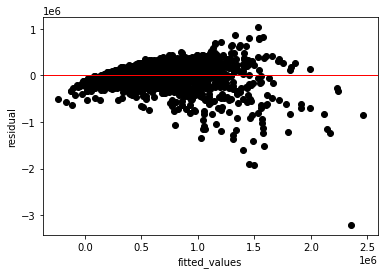

In [ ]:
# plotting residuals
import matplotlib.pyplot as plt
plt.scatter(y_pred, residuals, color = 'black')
plt.ylabel('residual')
plt.xlabel('fitted_values')
plt.axhline(y=residuals.mean(), color = 'red', linewidth = 1)
plt.show

The residuals seem to form a cone-shape where the residuals get larger as the prediction moves from small to large. An indication that the variance is increasing i.e the variance is Not equal. There is presence of heteroskedasticity in our data


In [ ]:
# performimg a heteroscedasticity test
import scipy as sp
test_result, p_value = sp.stats.bartlett(y_pred.flatten(), residuals.flatten())
test_result, p_value

(763.8213776850669, 3.964356303817666e-168)

In [ ]:
# defining parameters
df = len(y_pred) - 1
probability = 1 - p_value

# computing a critical value
critical_value = sp.stats.chi2.ppf(probability, df)
print(critical_value)

if (test_result > critical_value):
  print('the variances are unequal and the model should be reassessed')
else:
  print('the variances are homogeneous!')

inf
the variances are homogeneous!


The above findings verify our assumption the variances of the residuals is homogenous. However, from the residual plots we observe heteroscedasticity hence we conclude that our data has violated this assumption as a result chances are that our statistical results can't be trusted.

Heteroscedasticity tends to produce p-values that are smaller than they should be. This is because heteroscedasticity increases the variance of the coefficient estimates but the OLS procedure does not detect this increase. consequently, OLS calcultes t-values with an underestimated amount of variance. This model can lead to thinking that the model term is statistically significant while it is actually Not. Hence the reason for our statistical results contradicting the plots.

### Quantile Regression

From the linear regression model above, we have seen that the assumption that the error term has equal variance does Not hold for the data provided, hence we use quantile regression to predict a quantile for given independent variables.

In [ ]:
# creating features
# excluding the variables with high multicollineariry
M = house_df[['bedrooms', 'bathrooms', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]
              
n = house_df['price']

In [ ]:


#import statsmodels for quantile regression
import statsmodels.formula.api as smf

# finding the regression coefficients for the conditioned mean, 0.5 quantile
quantile_model = smf.quantreg('n ~ M', house_df)
res = quantile_model.fit(q = 0.5)

# print out the summary of the model
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                      n   Pseudo R-squared:               0.4490
Model:                       QuantReg   Bandwidth:                   2.021e+04
Method:                 Least Squares   Sparsity:                    2.745e+05
Date:                Sat, 01 Aug 2020   No. Observations:                21612
Time:                        15:41:10   Df Residuals:                    21596
                                        Df Model:                           15
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -55.4149      3.599    -15.398      0.000     -62.469     -48.361
M[0]        -636.4904   1258.078     -0.506      0.613   -3102.416    1829.436
M[1]        6.267e+04   2000.242     31.333      0.000    5.88e+04    6.66e+04
M[2]           0.2808      0.033      8.616      0.0

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


In [ ]:
## Similarly we can do the models for other quantiles
# 
quantiles = np.arange(0.1,1,0.1) 
models = []
params = []

# We build models for each quantile in our list quantiles inside a for loop
# As we build these models we also store the model parameters in a list called params. 
for qt in quantiles: 
	res = quantile_model.fit(q = qt )
	models.append(res)
	params.append([qt, res.params['Intercept'], res.params['M[0]']] + res.conf_int().loc['M[0]'].tolist())
 	# params.append([qt, res.params['Intercept'], res.params['M[1]']] + res.conf_int().loc['M[1]'].tolist())

# Lastly we make a dataframe of the same name, so we we can view our different models.
params = pd.DataFrame(data = params, columns = ['qt', 'intercept', 'x_coef', 'cf_lower_bound', 'cf_upper_bound'])
print(params)

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/

    qt   intercept        x_coef  cf_lower_bound  cf_upper_bound
0  0.1 -213.405079   6282.244915     3910.233814     8654.256016
1  0.2 -262.510111 -10812.032406   -12977.758759    -8646.306053
2  0.3 -329.055505   1897.017928     -444.954465     4238.990321
3  0.4 -212.862167   -481.877385    -2859.421614     1895.666844
4  0.5  -55.414905   -636.490413    -3102.416466     1829.435640
5  0.6   79.726917   1129.742119    -1544.184976     3803.669214
6  0.7  -37.423547   1577.967015    -1397.092487     4553.026516
7  0.8 -512.355433   2576.463283    -1103.446700     6256.373267
8  0.9  509.309631  -4339.313067   -10096.267170     1417.641036


/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


In [ ]:
## Similarly we can do the models for other quantiles
# 
quantiles = np.arange(0.1,1,0.1) 
models = []
params = []

# We build models for each quantile in our list quantiles inside a for loop
# As we build these models we also store the model parameters in a list called params. 
for qt in quantiles: 
	res = quantile_model.fit(q = qt )
	models.append(res)
	params.append([qt, res.params['Intercept'], res.params['M[1]']] + res.conf_int().loc['M[1]'].tolist())
 	# params.append([qt, res.params['Intercept'], res.params['M[1]']] + res.conf_int().loc['M[1]'].tolist())

# Lastly we make a dataframe of the same name, so we we can view our different models.
params = pd.DataFrame(data = params, columns = ['qt', 'intercept', 'x_coef', 'cf_lower_bound', 'cf_upper_bound'])
print(params)

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/

    qt   intercept        x_coef  cf_lower_bound  cf_upper_bound
0  0.1 -213.405079  39098.887894    35302.969006    42894.806782
1  0.2 -262.510111  45461.369587    42015.343403    48907.395771
2  0.3 -329.055505  55357.083136    51636.592314    59077.573959
3  0.4 -212.862167  59316.283401    55543.878055    63088.688746
4  0.5  -55.414905  62673.705000    58753.082755    66594.327246
5  0.6   79.726917  66631.510296    62359.745944    70903.274647
6  0.7  -37.423547  72156.655930    67374.994948    76938.316912
7  0.8 -512.355433  81116.985540    75049.310699    87184.660381
8  0.9  509.309631  95833.394348    85995.643320   105671.145377


/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


In [ ]:
# We estimate the quantile regression model for many quantiles between .05 and .95, 
# and compare best fit line from each of these models to Ordinary Least Squares result
# For convenience, we place the quantile regression results in a Pandas DataFrame, and the OLS results in a dictionary.

quantiles = np.arange(.05, .96, .1)
def fit_model(q):
    res = mod.fit(q=q)
    return [q, res.params['Intercept'], res.params['M[2]']] + \
            res.conf_int().loc['M[2]'].tolist()

models = [fit_model(x) for x in quantiles]
models = pd.DataFrame(models, columns=['q', 'a', 'b', 'lb', 'ub'])

ols = smf.ols('n ~ M', house_df).fit()
ols_ci = ols.conf_int().loc['M[2]'].tolist()
ols = dict(a = ols.params['Intercept'],
           b = ols.params['M[2]'],
           lb = ols_ci[0],
           ub = ols_ci[1])

print(models)
print(ols)

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/

      q            a         b        lb        ub
0  0.05  -302.974601  0.069942 -0.045049  0.184932
1  0.15    11.268381  0.203286  0.135640  0.270932
2  0.25   -24.089582  0.243068  0.183390  0.302745
3  0.35    17.065868  0.277370  0.213747  0.340993
4  0.45    62.308390  0.322087  0.257626  0.386548
5  0.55    21.836831  0.307372  0.243404  0.371339
6  0.65  -258.952605  0.332958  0.264640  0.401275
7  0.75 -1312.245083  0.404025  0.327644  0.480406
8  0.85   655.844038  0.531041  0.438873  0.623208
9  0.95   469.604015  0.755485  0.559800  0.951170
{'a': 8503775.921930114, 'b': 0.27086300464341806, 'lb': 0.17146063461640434, 'ub': 0.37026537467043175}


/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


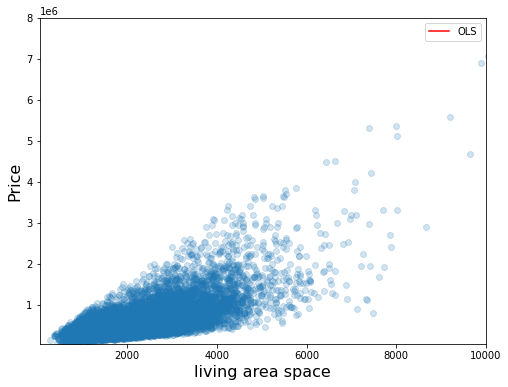

In [ ]:
# plotting best lines fit for quantile regression models to the least squares fit for the sqft column, M[2]

x = np.arange(house_df.sqft_living.min(), house_df.sqft_living.max(), 100)
get_y = lambda a, b: a + b * x

fig, ax = plt.subplots(figsize=(8, 6))

for i in range(models.shape[0]):
    y = get_y(models.a[i], models.b[i])
    ax.plot(x, y, linestyle='dotted', color='grey')

y = get_y(ols['a'], ols['b'])

ax.plot(x, y, color='red', label='OLS')
ax.scatter(house_df.sqft_living, house_df.price, alpha=.2)
ax.set_xlim((50, 10000))
ax.set_ylim((50000, 8000000))
legend = ax.legend()
ax.set_xlabel('living area space', fontsize=16)
ax.set_ylabel('Price', fontsize=16);

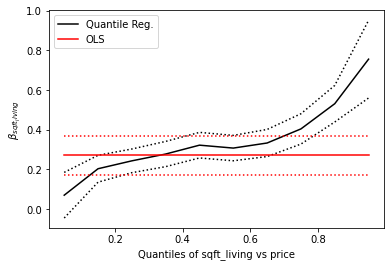

In [ ]:
n = models.shape[0]
p1 = plt.plot(models.q, models.b, color='black', label='Quantile Reg.')
p2 = plt.plot(models.q, models.ub, linestyle='dotted', color='black')
p3 = plt.plot(models.q, models.lb, linestyle='dotted', color='black')
p4 = plt.plot(models.q, [ols['b']] * n, color='red', label='OLS')
p5 = plt.plot(models.q, [ols['lb']] * n, linestyle='dotted', color='red')
p6 = plt.plot(models.q, [ols['ub']] * n, linestyle='dotted', color='red')
plt.ylabel(r'$\beta_{sqft_living}$')
plt.xlabel('Quantiles of sqft_living vs price')
plt.legend()
plt.show()

We will compare the impact the living area space has on the price of a house using quantile regression below

The dotted black lines form 95% point-wise confidence band around 10 quantile regression estimates (solid black line). The red lines represent OLS regression results along with their 95% confidence interval.

In most cases, the quantile regression point estimates lie inside the OLS confidence interval, which suggests that the effect of sqft_living on price may be constant across the distribution.

### Ridge Regression

Ridge Regression is a technique used when the data suffers from multicollinearity (independent variables are highly correlated). In multicollinearity, even though the least squares estimates are unbiased, their variances are large which deviates the observed value far from the true value. By adding a degree of bias to the regression estimates, ridge regression reduces the standard errors.
The assumptions of this regression is same as least squared regression except normality is not to be assumed

Ridge regression shrinks the value of coefficients but doesn’t reaches zero, to prevent multicollinearity.
As we've observed multicollinearity in our data, we will fit a ridge regression model to the data, which will introduce a penalty to the loss function in an attempt to minimize the loss function, hence reducing the value of the coefficients.


In [ ]:
# creating dependent and independent features
A = house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]
b = house_df["price"]

# splitting our data into test and train sets
A_train, A_test, b_train, b_test = train_test_split(A, b, test_size = 0.2, random_state = 0)

In [ ]:
# We use a grid to determine most appropriate value for l2 regularization
# we first create our ridge model and indicate normalization in order to get better estimates
# set up grid to determine the value of a hyperparemeter
# we specify a range of values between log of -5 and 2 and get 8 values from that range
# we specify our metric to be the mean squared error
# we specify we would like 10 folds to cross-validate our model

# loading required libraries
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge


ridge = Ridge(normalize = True)
search = GridSearchCV(estimator = ridge, param_grid={'alpha':np.logspace(-5,2,8)}, scoring = "neg_mean_squared_error", n_jobs=1, refit = True, cv = 10)


In [ ]:
# use the .fit function to run the model and then use the .best_params_ and
#  .best_scores_ function to determine the models strength.

search.fit(A_train,b_train)
search.best_params_
abs(search.best_score_)

41077706090.28432

The RMSE score is 41077706090 is higher than the RMSE score for the linear regression model. This means that this model has performed worse than the linear regression model. 



In [ ]:
# printing the best parameter from the grid
print(search.best_params_)

{'alpha': 0.001}


The value of alpha determines how our coefficients change i.e as we increase the value of alpha, the magnitude of our coefficients decreses. However, the best value of alpha is determined by the least Mean Squared error. From our grid, best value of alpha is 0.001 as it returns the least squared error.

In [ ]:
# fitting our model with ridge info and finding MSE

ridge = Ridge(normalize = True, alpha = 0.001)
ridge.fit(A_train,b_train)
ridge_model = (mean_squared_error(y_true = b_train, y_pred = ridge.predict(A_train)))
print(ridge_model)

40850284096.83813


The MSE is 4085367904, which is a reduction from the score obtained from the grid search, where the data had also been cross-validated. Hence the decrease could be attributed to the fact that the was not cross validated using the ridge model.


In [ ]:
# obtaining coeficients of our independent variables from the model

coef_dict_baseline = {}
for coef, feat in zip(ridge.coef_,A.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline


{'bathrooms': 42477.32245169608,
 'bedrooms': -39244.58038166521,
 'condition': 26547.20125153468,
 'floors': 5313.352759773204,
 'grade': 94516.81453479179,
 'lat': 610150.5805655246,
 'long': -211698.57418538243,
 'sqft_above': 95.11867911931127,
 'sqft_basement': 60.93956190696047,
 'sqft_living': 91.18426736091487,
 'sqft_living15': 18.228922114532136,
 'sqft_lot': 0.15041738639647678,
 'sqft_lot15': -0.42043698141362507,
 'view': 54995.04850461866,
 'waterfront': 600802.8421152476,
 'yr_built': -2625.327655978947,
 'yr_renovated': 19.518634208502803,
 'zipcode': -574.7268848129193}

We observe that the coefficients from the model have greatly reduced as compared to the coefficients obtained from the linear regression model. From the model above, the top three features that contribute most to the price of a house are:
*   lat' with a coefficient of : 610150.5805655246
*   waterfront' with a coefficient of: 600802.8421152476
*   long' with a coefficient of: -211698.57418538243

Bottom three factors that contribute the least to the price of a house are:
*   sqft_lot' with a coefficient of: 0.15041738639647678
*   sqft_lot15' with a coefficient of: -0.42043698141362507
*   sqft_living15' with a coefficient of: 18.228922114532136


**Important to note:** 

Ridge regression has shrunk the coefficients towards zero but it has not set any of them exactly to zero  as a result, it has included all the predictors in the final model, however less the impact of the predictor has on the response variable. i.e the model has not performed feature selection.

In conclusion, the ridge regression has performed worse than the linear regression model in predicting the price of a house but it has done a better job to group the features in order of importance.

### Lasso Regression

Lasso regression is a shrinkage and variable selection method for linear regression models that applies L1 regulaization. The goal of lasso regression is to obtain the subset of predictors that minimizes the loss function for a quantitative response variable. The lasso does this by imposing a penalty on the regression coefficients for some variables which causes they coefficients to shrink toward zero. Variables with a regression coefficient equal to zero after the shrinkage process are excluded from the model. Variables with non-zero regression coefficients variables are most strongly associated with the response variable.

The assumptions of lasso regression is same as least squared regression except normality is not to be assumed
Lasso Regression shrinks coefficients to zero (exactly zero), which certainly helps in feature selection

In [ ]:
# creating dependent and independent features
K = house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]
l = house_df["price"]

# Lasso put constraints on the size of the coefficients associated to each variable. 
# But, this value depends on the magnitude of each variable and it is therefore 
# necessary to center and reduce, or standardize, the variables.
# scaling our data
scaler = StandardScaler()
scaler.fit(K)
K = scaler.transform(K)

# we first train the lasso on the entire dataset
lasso = linear_model.Lasso()

# fitting the model
lasso.fit(K,l)

# print scores, MSE and coefficients
print("lasso score: ", lasso.score(K,l))
print("lasso score: ", mean_squared_error(l, lasso.predict(K)))
print("lasso coef:", lasso.coef_)

# splitting our data into test and train sets
# K_train, K_test, l_train, l_test = train_test_split(K, l, test_size = 0.2, random_state = 0)

lasso score:  0.7002327035588406
lasso score:  40454960071.27559
lasso coef: [-35510.04716486  33065.59403376 260562.33580006   5186.0649088
   2194.46382314  50326.57957861  40393.42873397  17065.78604596
 112420.80246466 -82681.2084346  -58672.12353436 -77275.49090896
   7893.2406809  -31175.42347442  83462.68993609 -30382.70181489
  14608.18079364 -10631.27584183]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27043883241601.25, tolerance: 291663769677.432
  positive)


The MSE score for the data fitted with the lasso regression model has decreased compared to the MSE score for the data fitted with the ridge regression. This is an indication that the lasso model has performed better than the ridge model. However, this model has performed worse than the linear model as it still has a higher MSE score. The magnitude of the coefficients has greatly reduced in comparison to the linear model.

In [ ]:
# Splitting the data into training and test sets, building Lasso, 
# and choosing the regularization parameter with the help of GridSearch. 
# For that, we have to define the set of parameters for GridSearch. 
# In this case, a model with the highest R-squared score will give us the best parameters.
# 

# Making necessary imports
import warnings
warnings.filterwarnings("ignore")

# splitting the data into training and test sets
K_train, K_test, l_train, l_test = train_test_split(K, l, test_size=0.2, random_state=0)
parameters = {'alpha': np.concatenate((np.arange(0.1,2,0.1), np.arange(2, 5, 0.5), np.arange(5, 25, 1)))}

lasso_linear = linear_model.LinearRegression()
lasso = linear_model.Lasso() 
gridlasso = GridSearchCV(lasso, parameters, scoring ='r2') 

# Fitting models and print the best parameters, R-squared scores, MSE, and coefficients
gridlasso.fit(K_train, l_train) 
lasso_linear.fit(K_train, l_train) 

print("lasso best parameters:", gridlasso.best_params_) 
print("lasso score:", gridlasso.score(X_test, y_test))
print("linear score:", linear.score(X_test, y_test)) 
print("lasso MSE:", mean_squared_error(y_test, gridlasso.predict(X_test)))
print("linear MSE:", mean_squared_error(y_test, linear.predict(X_test))) 


lasso best parameters: {'alpha': 0.1}
lasso score: -63267558.73684441
lasso MSE: 8.045890126333157e+18
linear MSE: 38933070462.233315


From the grid we set, the best value of alpha gotten from the grid is 0.1. From our output, we can clearly see that the MSE score obtained from the lasso regression is higher than the MSE score obtained from the linear regression model, hence we can conclude that the lasso model has not performed better than the regression model.

In [ ]:
print("lasso best estimator coef:", gridlasso.best_estimator_.coef_)
print("linear coef:", linear.coef_)

lasso best estimator coef: [-35760.63727491  32732.47861122 265608.00611943   6240.01126698
   2917.87937527  52017.9735779   42141.27372762  17247.12496556
 111304.88512668 -85008.60174633 -60609.90175136 -77312.33162929
   7789.89075263 -30871.28003823  84607.77188425 -29833.56094657
  12288.28543701 -11516.74393483]
linear coef: [[-3.93857899e+04  4.25017689e+04  1.12927588e+02  1.50658402e-01
   5.28716700e+03  6.01245251e+05  5.49920298e+04  2.65075827e+04
   9.46910607e+04  7.36096909e+01  3.93178968e+01 -2.63209855e+03
   1.93935248e+01 -5.76986709e+02  6.10618558e+05 -2.11848609e+05
   1.79301063e+01 -4.21805602e-01]]


Comparing the coefficients from the first lasso model to the second lasso model, the coefficients from the first model are slightly lower than the coefficients from the second model. This could be attributed to the fact that the first model was not cross-validated.

We observe a huge reduction in the magnitude of the coeficients from lasso regression in comparison to the coefficients from the linear regression.From the cross-validated lasso model, the 3 features with the most weights are:

*   sqft_living' with a coefficient of :265608.00 
*   grade' with coefficient of :111304.885
*   sqft_above'  with a coefficient of :85008.60

The 3 features with the least weights are:

*  floors' with coefficient of :2917.88
*  sqft_lot' with a coefficient of :6240.01 
*  yr_renovated with a coefficient of :7789.89

The limitation of lasso is that if a group of predictors is highly correlated, lasso picks one of them and shrinks the others to zero. We have not observed this as none of the coefficients were reduced to zero, this could mean that the model did not find any of the variables that were too highly corelated hence it only shrunk the coefficients.


### Elastic Net Regression

Elastic Net regression combines the power of L1 and L2 regularization into one. This is usually to ensure that the algorithm can remove weak variables altogether as with lasso or to reduce them to close to zero as with ridge regression.
Elastic Net regression encourages group effect in case of highly correlated variables. 
There are no limitations on the number of selected variables
The limitation with elastic Net is that it can suffer from double shrinkage.

In [ ]:
# calling dependent and independent variables
E = house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]
f = house_df["price"]

# splitting our data into test and train sets
E_train, E_test,f_train,f_test = train_test_split(E, f, test_size = 0.2, random_state = 0)

In [ ]:
# Elastic net, just like ridge and lasso regression, requires normalized data. 
# we create our grid and specify values of alpha between log -5 and 2
# l1 ratio is a range of values between 0 and 1

# loading elastic net library 
from sklearn.linear_model import ElasticNet
elastic=ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic,param_grid={'alpha':np.logspace(-5,2,8),'l1_ratio':[.2,.4,.6,.8]},
                    scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [ ]:
# We will now fit our model and display the best parameters and the best results we can get with that setup.
# 
search.fit(E,f)
search.best_params_
abs(search.best_score_)

40997616510.16252

The MSE score we have obtained is higher than the MSE score of the linear model, this mwans that the model has actually performed worse than the linear regression model

In [ ]:
print(search.best_params_)

{'alpha': 1e-05, 'l1_ratio': 0.8}


The best hyperparameters were set to an alpha value is 0.00001 and the l1 ratio that has given the best score is 0.8

In [ ]:
# For clarity, we will set our hyperparameters to the recommended values and run on the data.
# 
elastic=ElasticNet(normalize=True,alpha=0.00001,l1_ratio=0.8)
elastic.fit(E_train,f_train)
elastic_net_model=(mean_squared_error(y_true=f_test,y_pred=elastic.predict(E_test)))
print(elastic_net_model)

38908555596.04472


The MSE score is lower than the elastic net model with cross-validated data. The MSE score obtained from the elastic net model is the lowest value attained from all the models and it is the closest value we have obtained that is close to our linear regression model(baseline model) hence it is the model that has performed the best.

In [ ]:
# Below are the coefficients obtained from using the elastic net model
coef_dict_baseline = {}
for coef, feat in zip(elastic.coef_,E.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

{'bathrooms': 41775.838840860655,
 'bedrooms': -34860.07469930003,
 'condition': 27588.442442232885,
 'floors': 6138.502223506866,
 'grade': 89313.78692315363,
 'lat': 594595.6783223909,
 'long': -206060.805620952,
 'sqft_above': 91.18833249817358,
 'sqft_basement': 60.53526531792385,
 'sqft_living': 87.90378228914264,
 'sqft_living15': 26.80662015298555,
 'sqft_lot': 0.14232667554724485,
 'sqft_lot15': -0.37758873983246105,
 'view': 55066.35164469658,
 'waterfront': 586408.8846597602,
 'yr_built': -2421.0098935987867,
 'yr_renovated': 23.139609528579527,
 'zipcode': -505.58395419939484}

None of the values have been shrinked to zero just like we observed in our lasso model. However, we have a couple of features that have been reduced to almost zero just like we observed in our ridge model. Thus, the elastic net model has comined the power of both the ridge and the lasso models above. 

The following are the three features with the most weight:

*   'lat' with a coefficient of : 594595.6783223909,
*   'waterfront' with a coefficient of : 586408.8846597602,
*   'long' with a coefficinet of : -206060.805620952,

The following are the features with the least weights:

*   'sqft_lot' with a coefficient of : 0.14232667554724485,
*   'sqft_lot15' with a coefficient of : -0.37758873983246105,
*   'yr_renovated' with a coefficient of : 23.139609528579527,


Most of the coefficients have also greatly reduced in comparison to all the other models, this could mean that the model might have over-shrunk the coefficients, which is the limitation of the elastic net model.

In [ ]:
# plotting residuals
import matplotlib.pyplot as plt
plt.scatter(y_pred, residuals, color = 'black')
plt.ylabel('residual')
plt.xlabel('fitted_values')
plt.axhline(y=residuals.mean(), color = 'red', linewidth = 1)
plt.show

**A comparison of the results obtained from the three methods that use regularization**

In terms of magnitude of the coefficient values obtained, the ridge model and the elastic net model have grouped the same features as the varibales carrying most weights i.e** latitude, waterfront and longitude of the house**
The weights of the features vary greatly for both the ridge and elastic net regression models as compared to the lasso regression. 

**Regularization has assisted in the following ways:**

Variance - bias trade_off, elastic net traded some variance with bias hence it produced a lower MSE

Easier interpretation of the output as it is now easier to tell which predictor variables influence the response variable more.

## challenging the solution


From all the five models used to fit the data, we have obtained the least MSE from the elastic net model hence concluded that it was the best model to predict the price of a house. However, the model still has a significantly high MSE score. 

From the Elastic net model, the predictor variables that influence response variable the most are the :

1.   Latitude column
1.   Whether the house has a waterfall or not
1.   Longitude column. 

This is an indication that the location of the house is the strongest contributor to the price of the house. Hence I would recommend that the stakeholders and the management pay more attention to the location of the house and pay less attention to the land space the house has been built on, the area space between the house and the neighbouring houses and the year the house was renovated as they have the least influence to the price of a house.

A major concern is that the features with the most weight from lasso regression are totally different from the features with the most weight from both ridge model and elastic net models. This could be misleading because the model that is the best for prediction is Not necessarily the best model for grouping or selecting features.

Upon cross-validating the data on the linear regression, the MSE scores obtained is the lowest observed which will be difficult to beat.


In [ ]:
# cross validating our model using Leave One Out cross - validation

# calling train and test sets
X = house_df[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition','grade', 
              'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']].values
y = house_df["price"].values.reshape(-1,1)

# importing leave one out library
from sklearn.model_selection import LeaveOneOut

#
folds = LeaveOneOut()

#find out how many folds set up for using  get_n_splits
print('we are using ' + str (folds.get_n_splits(X)) + ' folds')

# create and assess five models based on the folds we have created

RMSES = []
count = 0
for train_index, test_index in folds.split(X):
  # set up train and test based on split determined by kfold
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]

  # fitting a linear regression
  linear = LinearRegression()
  linear.fit(X_train, y_train)

# baseline_linear_model = (mean_squared_error(y_true = y_test, y_pred = linear.predict(X_test))) 
# print(baseline_linear_model)                     

  # making predictions
  y_pred = linear.predict(X_test)

  from sklearn import metrics
  # assessing the accuracy of the model
  rmse_value = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
  RMSES.append (rmse_value)

  count = count + 1

print('trained '+str(count) + ' models')
print('--------------------------')
print('The mean of the RMSES is: ' + str (np.mean(RMSES)))


we are using 21612 folds
trained 21612 models
--------------------------
The mean of the RMSES is: 126247.51338306867


The MSE score has reduced significantly after cross - validating our data. This is the best score which will be difficult to beat.

## Follow up questions

After successful completion of this study, the following questions arose:
We have concluded that the location of the house is the most influential to the pricing of the house, hence which are the most promising locations to sell a house? i.e which latitudes and longitudes should the company consider the most valuable to them? Should they put more effort into these locations? 
